In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [2]:
import tensorflow
print (tensorflow.__version__)

2.3.0


In [4]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [5]:
!unzip /content/gdrive/MyDrive/GAN_datasets/anime.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/images/62764_2019.jpg  
  inflating: /content/images/62765_2019.jpg  
  inflating: /content/images/62766_2019.jpg  
  inflating: /content/images/62767_2019.jpg  
  inflating: /content/images/62768_2019.jpg  
  inflating: /content/images/62769_2019.jpg  
  inflating: /content/images/6276_2003.jpg  
  inflating: /content/images/62770_2019.jpg  
  inflating: /content/images/62771_2019.jpg  
  inflating: /content/images/62772_2019.jpg  
  inflating: /content/images/62773_2019.jpg  
  inflating: /content/images/62774_2019.jpg  
  inflating: /content/images/62775_2019.jpg  
  inflating: /content/images/62776_2019.jpg  
  inflating: /content/images/62777_2019.jpg  
  inflating: /content/images/62778_2019.jpg  
  inflating: /content/images/62779_2019.jpg  
  inflating: /content/images/6277_2003.jpg  
  inflating: /content/images/62780_2019.jpg  
  inflating: /content/images/62781_2019.jpg  
  inflating: /content/images/62

In [6]:
import glob
files = glob.glob('/content/images/*.jpg')
len(files)

63565

In [7]:
for file in files[:10]:
    anime_img = cv2.imread(file)
    print (anime_img.shape)

(124, 124, 3)
(93, 93, 3)
(116, 116, 3)
(103, 103, 3)
(98, 98, 3)
(69, 69, 3)
(78, 78, 3)
(92, 92, 3)
(97, 97, 3)
(122, 122, 3)


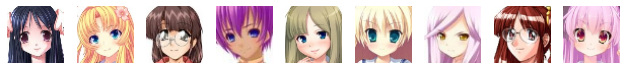

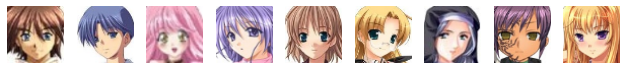

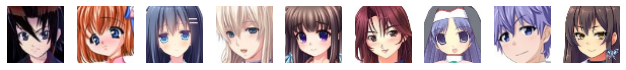

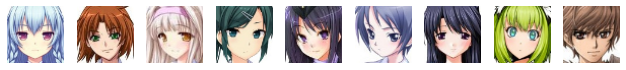

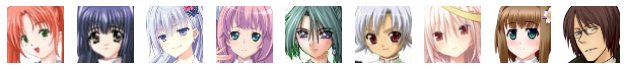

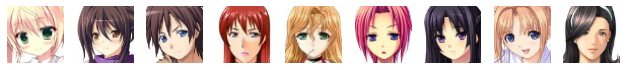

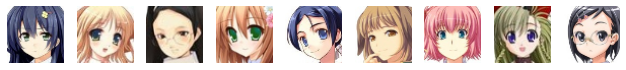

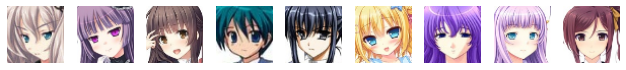

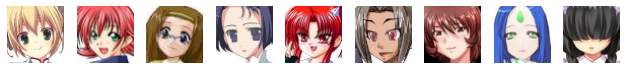

In [8]:
for k in range(9):
    plt.figure(figsize=(11, 11))
    for j in range(9):
        f = np.random.choice(files)
        anime_img = cv2.imread(f)
        anime_img = cv2.cvtColor(anime_img, cv2.COLOR_BGR2RGB)
        anime_img = cv2.resize(anime_img, (56, 56))
        plt.subplot(990 + 1 + j)
        plt.imshow(anime_img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

In [9]:
from tqdm import tqdm_notebook

images = []
for file in tqdm_notebook(files):
    anime_img = cv2.imread(file)
    anime_img = cv2.cvtColor(anime_img, cv2.COLOR_BGR2RGB)
    anime_img = cv2.resize(anime_img, (56, 56))
    images.append((anime_img-127.5)/127.5)

images = np.array(images)
print (images.shape)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.



(63565, 56, 56, 3)


# Generator Model

In [10]:
random_input = tensorflow.keras.layers.Input(shape = 100)

x = tensorflow.keras.layers.Dense(128 * 5 * 5)(random_input)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Reshape((5, 5, 128))(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(3,3), strides=(2,2))(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(3,3), strides=(2,2))(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(3,3), strides=(2,2))(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(4,4))(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5))(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5))(x)
x = tensorflow.keras.layers.Activation('relu')(x)

x = tensorflow.keras.layers.Conv2D(filters=3, kernel_size=(3,3))(x)
generated_image = tensorflow.keras.layers.Activation('tanh')(x)

generator_network = tensorflow.keras.models.Model(inputs=random_input, outputs=generated_image)
generator_network.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
dense (Dense)                (None, 3200)              323200    
_________________________________________________________________
activation (Activation)      (None, 3200)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 3200)              12800     
_________________________________________________________________
reshape (Reshape)            (None, 5, 5, 128)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 11, 11, 128)       147584    
_________________________________________________________________
activation_1 (Activation)    (None, 11, 11, 128)      

# Discriminator

In [12]:
image_input = tensorflow.keras.layers.Input(shape=(56, 56, 3))

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(3,3))(image_input)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=2)(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=2)(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5))(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5))(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Flatten()(x)

x = tensorflow.keras.layers.Dense(1)(x)
real_vs_fake_output = tensorflow.keras.layers.Activation('sigmoid')(x)

discriminator_network = tensorflow.keras.models.Model(inputs=image_input, outputs=real_vs_fake_output)
discriminator_network.summary()

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 56, 56, 3)]       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 54, 54, 128)       3584      
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 54, 54, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 25, 25, 64)        204864    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 25, 25, 64)        0         
_________________________________________________________________
batch_normalization_10 (Batc (None, 25, 25, 64)        256       
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 11, 11, 64)       

In [13]:
adam_optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5)
discriminator_network.compile(loss='binary_crossentropy', optimizer=adam_optimizer, metrics=['accuracy'])

# DC GAN

In [14]:
discriminator_network.trainable=False

g_output = generator_network(random_input)
d_output = discriminator_network(g_output)

dcgan_model = tensorflow.keras.models.Model(random_input, d_output)
dcgan_model.summary()

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
functional_1 (Functional)    (None, 56, 56, 3)         1866499   
_________________________________________________________________
functional_5 (Functional)    (None, 1)                 517441    
Total params: 2,383,940
Trainable params: 1,858,819
Non-trainable params: 525,121
_________________________________________________________________


# Compiling Models

In [15]:
dcgan_model.compile(loss='binary_crossentropy', optimizer=adam_optimizer)

# Define Data Generators

In [16]:
indices = [i for i in range(0, len(images))]

def get_random_noise(batch_size, noise_size):
    random_values = np.random.randn(batch_size*noise_size)
    random_noise_batch = np.reshape(random_values, (batch_size, noise_size))
    return random_noise_batch

def get_fake_samples(generator_network, batch_size, noise_size):
    random_noise_batch = get_random_noise(batch_size, noise_size) 
    fake_samples = generator_network.predict_on_batch(random_noise_batch)
    return fake_samples

def get_real_samples(batch_size):
    random_indices = np.random.choice(indices, size=batch_size)
    real_images = images[np.array(random_indices),:]
    return real_images

def show_generator_results(generator_network):
    for k in range(9):
        plt.figure(figsize=(11, 11))
        fake_samples = get_fake_samples(generator_network, 9, noise_size)
        fake_samples = (fake_samples+1.0)/2.0
        for j in range(9):
            plt.subplot(990 + 1 + j)
            plt.imshow(fake_samples[j])
            plt.axis('off')
            #plt.title(trainY[i])
        plt.show()
    return

# Training GAN

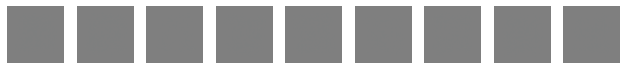

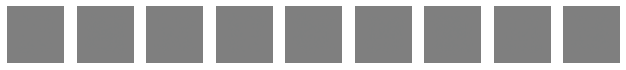

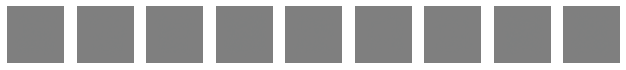

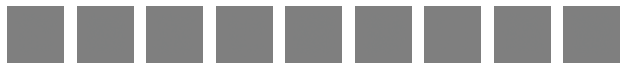

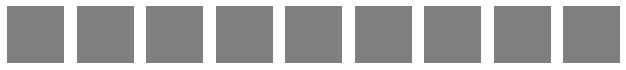

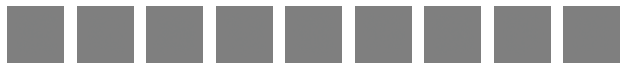

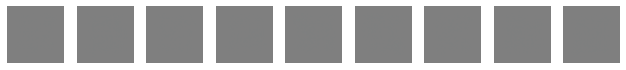

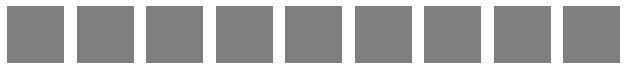

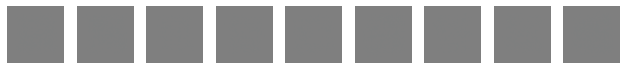

Epoch:0, Step:0, D-Loss:0.816, D-Acc:37.000, G-Loss:0.714
Epoch:0, Step:50, D-Loss:0.021, D-Acc:100.000, G-Loss:4.888
Epoch:0, Step:100, D-Loss:0.087, D-Acc:96.000, G-Loss:4.839
Epoch:0, Step:150, D-Loss:0.116, D-Acc:97.000, G-Loss:8.926
Epoch:0, Step:200, D-Loss:0.108, D-Acc:96.000, G-Loss:2.893
Epoch:0, Step:250, D-Loss:0.021, D-Acc:100.000, G-Loss:9.395
Epoch:0, Step:300, D-Loss:0.173, D-Acc:93.000, G-Loss:3.882
Epoch:0, Step:350, D-Loss:0.165, D-Acc:94.000, G-Loss:4.459
Epoch:0, Step:400, D-Loss:0.112, D-Acc:95.000, G-Loss:2.763
Epoch:0, Step:450, D-Loss:0.117, D-Acc:94.000, G-Loss:5.952
Epoch:1, Step:0, D-Loss:0.065, D-Acc:98.000, G-Loss:5.853
Epoch:1, Step:50, D-Loss:0.011, D-Acc:100.000, G-Loss:7.191
Epoch:1, Step:100, D-Loss:0.011, D-Acc:100.000, G-Loss:9.765
Epoch:1, Step:150, D-Loss:0.064, D-Acc:99.000, G-Loss:9.575
Epoch:1, Step:200, D-Loss:0.063, D-Acc:98.000, G-Loss:7.350
Epoch:1, Step:250, D-Loss:0.112, D-Acc:96.000, G-Loss:7.690
Epoch:1, Step:300, D-Loss:0.121, D-Acc:95.

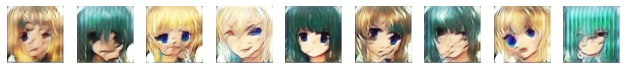

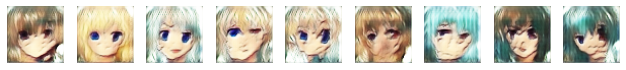

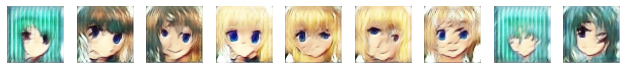

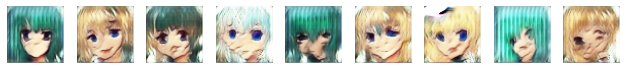

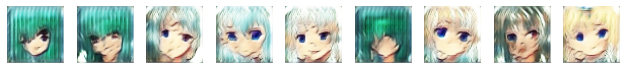

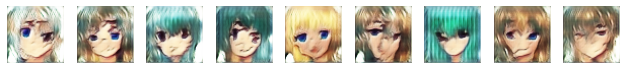

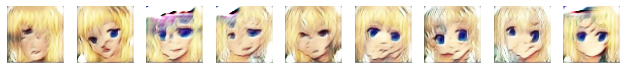

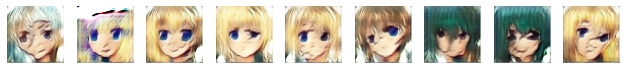

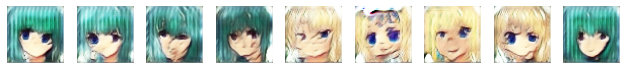

Epoch:10, Step:0, D-Loss:0.217, D-Acc:92.000, G-Loss:3.456
Epoch:10, Step:50, D-Loss:0.062, D-Acc:97.000, G-Loss:2.442
Epoch:10, Step:100, D-Loss:0.120, D-Acc:95.000, G-Loss:7.680
Epoch:10, Step:150, D-Loss:0.083, D-Acc:97.000, G-Loss:1.531
Epoch:10, Step:200, D-Loss:0.112, D-Acc:95.000, G-Loss:7.302
Epoch:10, Step:250, D-Loss:0.138, D-Acc:95.000, G-Loss:0.843
Epoch:10, Step:300, D-Loss:0.020, D-Acc:100.000, G-Loss:1.613
Epoch:10, Step:350, D-Loss:0.133, D-Acc:96.000, G-Loss:5.284
Epoch:10, Step:400, D-Loss:0.090, D-Acc:96.000, G-Loss:4.870
Epoch:10, Step:450, D-Loss:0.097, D-Acc:97.000, G-Loss:5.381
Epoch:11, Step:0, D-Loss:0.121, D-Acc:95.000, G-Loss:6.098
Epoch:11, Step:50, D-Loss:0.075, D-Acc:96.000, G-Loss:6.991
Epoch:11, Step:100, D-Loss:0.009, D-Acc:100.000, G-Loss:3.813
Epoch:11, Step:150, D-Loss:0.019, D-Acc:100.000, G-Loss:2.900
Epoch:11, Step:200, D-Loss:0.087, D-Acc:97.000, G-Loss:6.292
Epoch:11, Step:250, D-Loss:0.154, D-Acc:92.000, G-Loss:3.703
Epoch:11, Step:300, D-Loss:

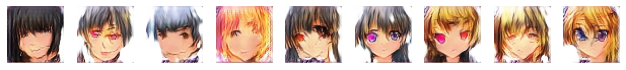

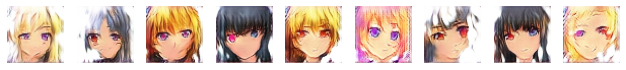

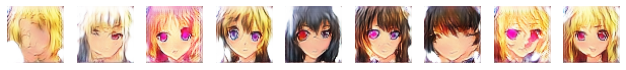

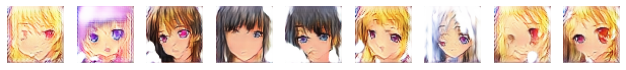

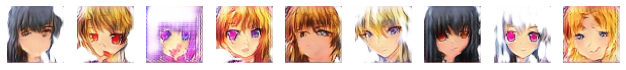

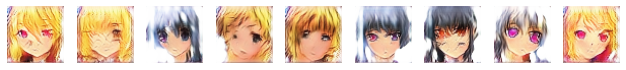

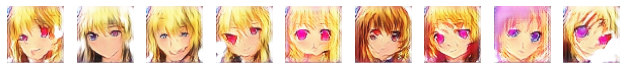

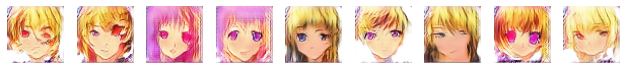

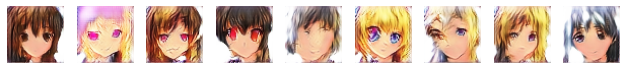

Epoch:20, Step:0, D-Loss:0.029, D-Acc:99.000, G-Loss:3.054
Epoch:20, Step:50, D-Loss:0.105, D-Acc:95.000, G-Loss:6.795
Epoch:20, Step:100, D-Loss:0.009, D-Acc:100.000, G-Loss:5.350
Epoch:20, Step:150, D-Loss:0.149, D-Acc:93.000, G-Loss:6.234
Epoch:20, Step:200, D-Loss:0.191, D-Acc:96.000, G-Loss:3.171
Epoch:20, Step:250, D-Loss:0.050, D-Acc:99.000, G-Loss:0.946
Epoch:20, Step:300, D-Loss:0.182, D-Acc:93.000, G-Loss:2.500
Epoch:20, Step:350, D-Loss:0.235, D-Acc:90.000, G-Loss:0.015
Epoch:20, Step:400, D-Loss:0.208, D-Acc:91.000, G-Loss:2.018
Epoch:20, Step:450, D-Loss:0.319, D-Acc:89.000, G-Loss:1.828
Epoch:21, Step:0, D-Loss:0.273, D-Acc:91.000, G-Loss:4.455
Epoch:21, Step:50, D-Loss:0.175, D-Acc:92.000, G-Loss:1.499
Epoch:21, Step:100, D-Loss:0.253, D-Acc:91.000, G-Loss:4.626
Epoch:21, Step:150, D-Loss:0.017, D-Acc:100.000, G-Loss:5.412
Epoch:21, Step:200, D-Loss:0.209, D-Acc:93.000, G-Loss:2.969
Epoch:21, Step:250, D-Loss:0.006, D-Acc:100.000, G-Loss:5.530
Epoch:21, Step:300, D-Loss:

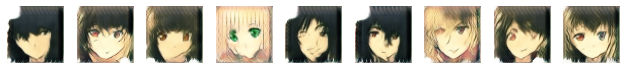

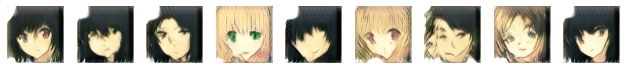

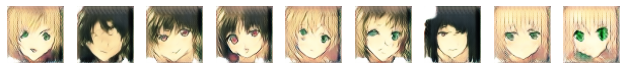

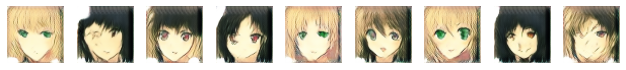

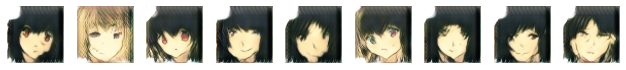

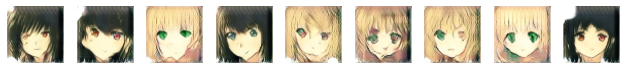

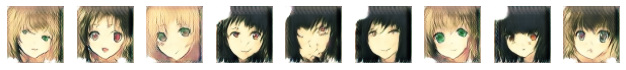

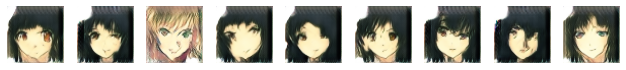

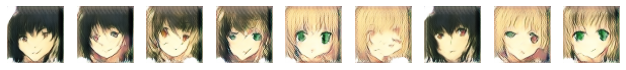

Epoch:30, Step:0, D-Loss:0.013, D-Acc:99.000, G-Loss:7.402
Epoch:30, Step:50, D-Loss:0.097, D-Acc:98.000, G-Loss:6.458
Epoch:30, Step:100, D-Loss:0.044, D-Acc:98.000, G-Loss:6.461
Epoch:30, Step:150, D-Loss:0.011, D-Acc:100.000, G-Loss:3.298
Epoch:30, Step:200, D-Loss:0.041, D-Acc:99.000, G-Loss:0.212
Epoch:30, Step:250, D-Loss:0.023, D-Acc:99.000, G-Loss:8.437
Epoch:30, Step:300, D-Loss:0.007, D-Acc:100.000, G-Loss:3.278
Epoch:30, Step:350, D-Loss:0.008, D-Acc:100.000, G-Loss:7.424
Epoch:30, Step:400, D-Loss:0.075, D-Acc:97.000, G-Loss:6.722
Epoch:30, Step:450, D-Loss:0.031, D-Acc:99.000, G-Loss:0.543
Epoch:31, Step:0, D-Loss:0.001, D-Acc:100.000, G-Loss:6.497
Epoch:31, Step:50, D-Loss:0.044, D-Acc:99.000, G-Loss:3.657
Epoch:31, Step:100, D-Loss:0.004, D-Acc:100.000, G-Loss:5.786
Epoch:31, Step:150, D-Loss:0.042, D-Acc:99.000, G-Loss:5.240
Epoch:31, Step:200, D-Loss:0.011, D-Acc:100.000, G-Loss:1.162
Epoch:31, Step:250, D-Loss:0.036, D-Acc:100.000, G-Loss:2.758
Epoch:31, Step:300, D-L

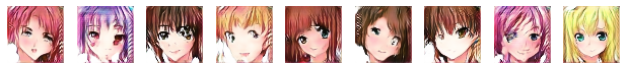

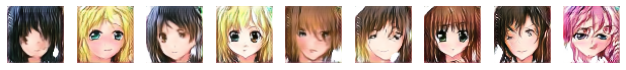

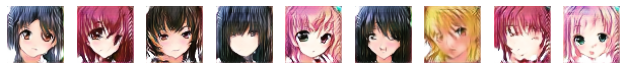

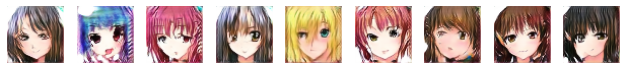

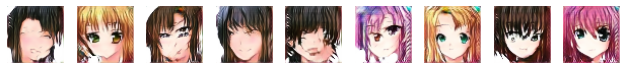

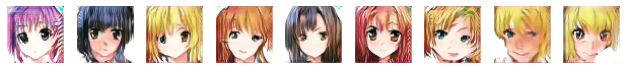

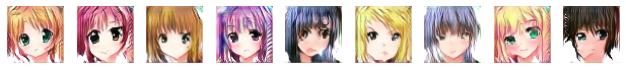

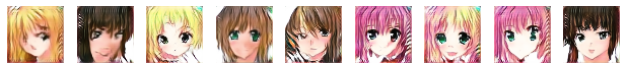

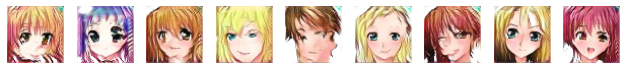

Epoch:40, Step:0, D-Loss:0.098, D-Acc:96.000, G-Loss:4.602
Epoch:40, Step:50, D-Loss:0.207, D-Acc:91.000, G-Loss:1.203
Epoch:40, Step:100, D-Loss:0.286, D-Acc:85.000, G-Loss:2.641
Epoch:40, Step:150, D-Loss:0.033, D-Acc:98.000, G-Loss:2.091
Epoch:40, Step:200, D-Loss:0.002, D-Acc:100.000, G-Loss:4.167
Epoch:40, Step:250, D-Loss:0.139, D-Acc:95.000, G-Loss:2.108
Epoch:40, Step:300, D-Loss:0.145, D-Acc:95.000, G-Loss:1.672
Epoch:40, Step:350, D-Loss:0.094, D-Acc:96.000, G-Loss:1.138
Epoch:40, Step:400, D-Loss:0.155, D-Acc:91.000, G-Loss:2.996
Epoch:40, Step:450, D-Loss:0.080, D-Acc:97.000, G-Loss:5.858
Epoch:41, Step:0, D-Loss:0.032, D-Acc:99.000, G-Loss:5.688
Epoch:41, Step:50, D-Loss:0.014, D-Acc:100.000, G-Loss:7.034
Epoch:41, Step:100, D-Loss:0.039, D-Acc:99.000, G-Loss:0.640
Epoch:41, Step:150, D-Loss:0.065, D-Acc:98.000, G-Loss:2.887
Epoch:41, Step:200, D-Loss:0.146, D-Acc:95.000, G-Loss:0.058
Epoch:41, Step:250, D-Loss:0.115, D-Acc:95.000, G-Loss:8.138
Epoch:41, Step:300, D-Loss:0

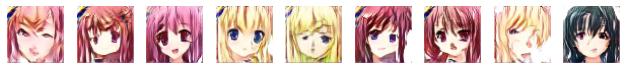

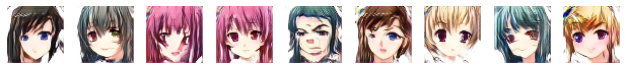

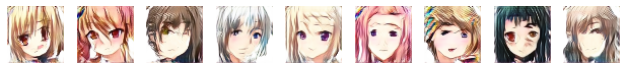

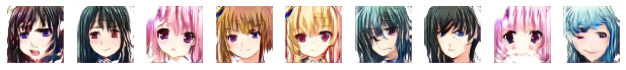

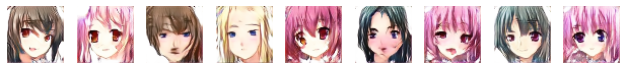

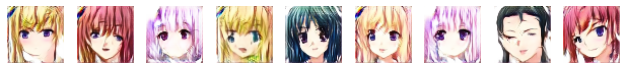

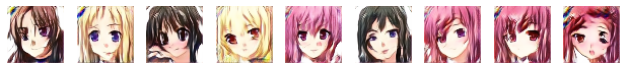

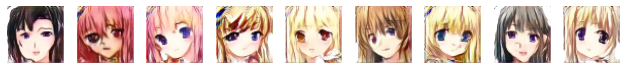

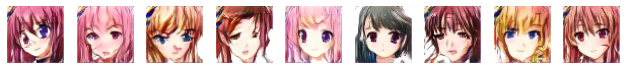

Epoch:50, Step:0, D-Loss:0.388, D-Acc:84.000, G-Loss:0.329
Epoch:50, Step:50, D-Loss:0.233, D-Acc:89.000, G-Loss:3.992
Epoch:50, Step:100, D-Loss:0.100, D-Acc:95.000, G-Loss:0.000
Epoch:50, Step:150, D-Loss:0.018, D-Acc:100.000, G-Loss:4.340
Epoch:50, Step:200, D-Loss:0.138, D-Acc:94.000, G-Loss:0.154
Epoch:50, Step:250, D-Loss:0.061, D-Acc:99.000, G-Loss:1.766
Epoch:50, Step:300, D-Loss:0.163, D-Acc:92.000, G-Loss:0.073
Epoch:50, Step:350, D-Loss:0.081, D-Acc:96.000, G-Loss:1.367
Epoch:50, Step:400, D-Loss:0.058, D-Acc:97.000, G-Loss:7.263
Epoch:50, Step:450, D-Loss:0.064, D-Acc:97.000, G-Loss:1.816
Epoch:51, Step:0, D-Loss:0.116, D-Acc:96.000, G-Loss:0.712
Epoch:51, Step:50, D-Loss:0.128, D-Acc:95.000, G-Loss:0.080
Epoch:51, Step:100, D-Loss:0.091, D-Acc:98.000, G-Loss:0.318
Epoch:51, Step:150, D-Loss:0.144, D-Acc:95.000, G-Loss:0.115
Epoch:51, Step:200, D-Loss:0.295, D-Acc:88.000, G-Loss:0.000
Epoch:51, Step:250, D-Loss:0.094, D-Acc:97.000, G-Loss:1.337
Epoch:51, Step:300, D-Loss:0.

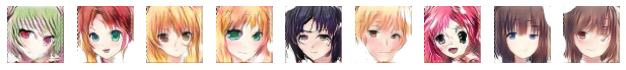

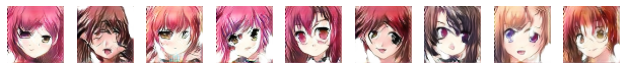

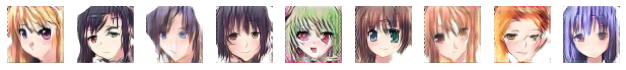

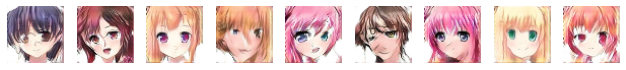

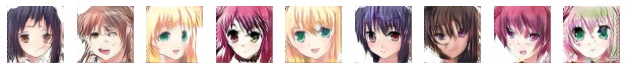

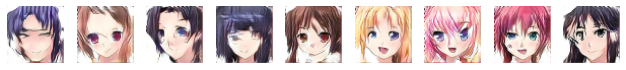

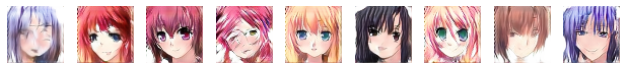

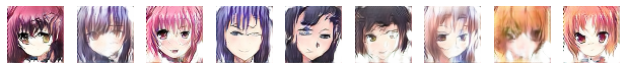

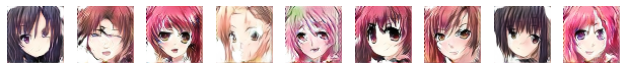

Epoch:60, Step:0, D-Loss:0.147, D-Acc:93.000, G-Loss:1.167
Epoch:60, Step:50, D-Loss:0.063, D-Acc:99.000, G-Loss:0.609
Epoch:60, Step:100, D-Loss:0.234, D-Acc:90.000, G-Loss:5.772
Epoch:60, Step:150, D-Loss:0.068, D-Acc:98.000, G-Loss:5.159
Epoch:60, Step:200, D-Loss:0.132, D-Acc:96.000, G-Loss:5.038
Epoch:60, Step:250, D-Loss:0.051, D-Acc:100.000, G-Loss:1.926
Epoch:60, Step:300, D-Loss:0.077, D-Acc:98.000, G-Loss:2.179
Epoch:60, Step:350, D-Loss:0.035, D-Acc:98.000, G-Loss:4.765
Epoch:60, Step:400, D-Loss:0.003, D-Acc:100.000, G-Loss:6.259
Epoch:60, Step:450, D-Loss:0.007, D-Acc:100.000, G-Loss:4.154
Epoch:61, Step:0, D-Loss:0.077, D-Acc:97.000, G-Loss:0.010
Epoch:61, Step:50, D-Loss:0.125, D-Acc:94.000, G-Loss:0.063
Epoch:61, Step:100, D-Loss:0.068, D-Acc:98.000, G-Loss:0.073
Epoch:61, Step:150, D-Loss:0.088, D-Acc:97.000, G-Loss:6.494
Epoch:61, Step:200, D-Loss:0.034, D-Acc:100.000, G-Loss:3.248
Epoch:61, Step:250, D-Loss:0.300, D-Acc:88.000, G-Loss:3.894
Epoch:61, Step:300, D-Loss

In [ ]:
epochs = 100
batch_size = 100
steps = 500
noise_size = 100

for i in range(0, epochs):
    if (i%10 == 0):
        show_generator_results(generator_network)
    for j in range(steps):
        fake_samples = get_fake_samples(generator_network, batch_size//2, noise_size)
        real_samples = get_real_samples(batch_size=batch_size//2)

        fake_y = np.zeros((batch_size//2, 1))
        real_y = np.ones((batch_size//2, 1))
        
        input_batch = np.vstack((fake_samples, real_samples))
        output_labels = np.vstack((fake_y, real_y))
        
        # Updating Discriminator weights
        discriminator_network.trainable=True
        loss_d = discriminator_network.train_on_batch(input_batch, output_labels)
        
        gan_input = get_random_noise(batch_size, noise_size)
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        gan_output = np.ones((batch_size))
        
        # Updating Generator weights
        discriminator_network.trainable=False
        loss_g = dcgan_model.train_on_batch(gan_input, gan_output)
        
        if j%50 == 0:
            print ("Epoch:%.0f, Step:%.0f, D-Loss:%.3f, D-Acc:%.3f, G-Loss:%.3f"%(i,j,loss_d[0],loss_d[1]*100,loss_g))
            

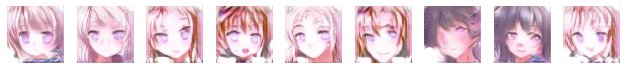

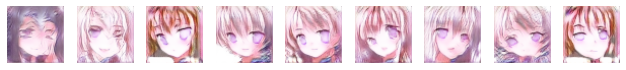

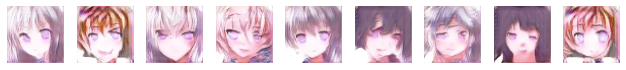

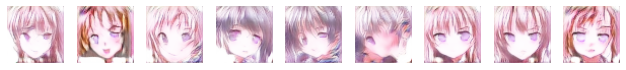

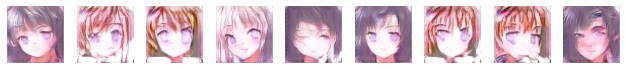

...

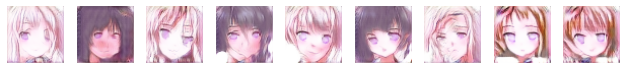

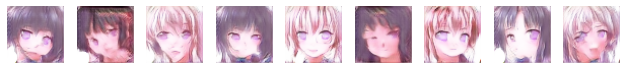

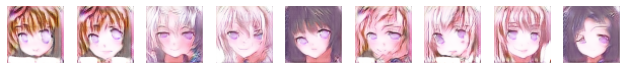

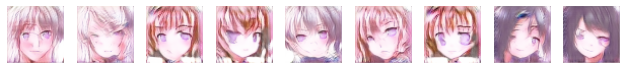

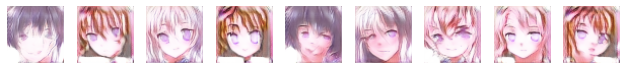

In [ ]:
#Generating Unlimited samples

for i in range(5):
    show_generator_results(generator_network)

In [ ]:
generator_network.save('/content/gdrive/MyDrive/GAN_datasets/anime_model')